In [1]:
import random
import cv2
import tensorflow as tf
import numpy as np
import tensorflow_similarity as tfsim

#from tabulate import tabulate
#from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam

from tensorflow_similarity.utils import tf_cap_memory
from tensorflow_similarity.layers import MetricEmbedding # row wise L2 norm
from tensorflow_similarity.losses import MultiSimilarityLoss  # specialized similarity loss
from tensorflow_similarity.models import SimilarityModel # TF model with additional features
from tensorflow_similarity.samplers import MultiShotMemorySampler  # sample data 
from tensorflow_similarity.samplers import select_examples  # select n example per class
from tensorflow_similarity.visualization import viz_neigbors_imgs  # neigboors vizualisation
from tensorflow_similarity.visualization import confusion_matrix  # matching performance
import os

2021-09-24 09:34:24.611170: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-24 09:34:24.616821: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-24 09:34:24.617176: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-24 09:34:24.618170: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [11]:
folder = './imagenes_test'
clases = [name for name in os.listdir(folder) if os.path.isdir(os.path.join(folder, name))]
#clases.sort()

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  'imagenes_train',
  image_size=(240, 240),
  class_names=clases,
  batch_size = 1
  )

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
  'imagenes_test',
  image_size=(240, 240),
  class_names=clases,
  batch_size = 1
  )

Found 216 files belonging to 27 classes.
Found 54 files belonging to 27 classes.


# Creación del dataset a partir de la imagenes

In [3]:
# Vectores para guardar el dataset
x_train = []
y_train = []

x_test = []
y_test = []

dataset_train = train_ds.enumerate()
dataset_test = test_ds.enumerate()

for element in dataset_train.as_numpy_iterator():
  x_train.append(element[1][0])
  y_train.append(element[1][1])

for element in dataset_test.as_numpy_iterator():
  x_test.append(element[1][0])
  y_test.append(element[1][1])


# Se dejan como enteros 
x_train = np.asarray(x_train).astype(int)
y_train = np.asarray(y_train).astype(int)
x_test = np.asarray(x_test).astype(int)
y_test = np.asarray(y_test).astype(int)


# Reshape del dataset al formato de la red neuronal
x_train = np.reshape(x_train, (216,240,240,3))
y_train = np.reshape(y_train, (216))
x_test = np.reshape(x_test, (54,240,240,3))
y_test = np.reshape(y_test, (54))


2021-09-24 09:34:26.921939: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


In [4]:
CLASSES = [i for i in range(27)]
NUM_CLASSES = 27  #@param {type: "slider", min: 1, max: 10}
CLASS_PER_BATCH = NUM_CLASSES
EXAMPLE_PER_CLASS = 2 #@param {type:"integer"}
STEPS_PER_EPOCH = 20 #@param {type:"integer"}

sampler = MultiShotMemorySampler(x_train, y_train, 
                                 classes_per_batch=CLASS_PER_BATCH, 
                                 examples_per_class_per_batch=EXAMPLE_PER_CLASS,
                                 class_list=CLASSES[:NUM_CLASSES], 
                                 steps_per_epoch=STEPS_PER_EPOCH)


Batch size is 54 (27 class X 2 example per class pre-augmentation


indexing classes: 100%|██████████| 216/216 [00:00<00:00, 1690241.91it/s]


In [5]:
def get_model():
    inputs = layers.Input((240, 240, 3))
    x = layers.experimental.preprocessing.Rescaling(1/255)(inputs)
    x = layers.Conv2D(32, 7, activation='relu')(x)
    x = layers.MaxPool2D()(x)
    x = layers.Conv2D(32, 3, activation='relu')(x)
    x = layers.MaxPool2D()(x)
    x = layers.Conv2D(32, 3, activation='relu')(x)
    x = layers.MaxPool2D()(x)
    x = layers.Conv2D(64, 7, activation='relu')(x)
    x = layers.MaxPool2D()(x)
    x = layers.Conv2D(64, 3, activation='relu')(x)
    x = layers.Flatten()(x)
    x = layers.Dense(64, activation='relu')(x)
    # smaller embeddings will have faster lookup times while a larger embedding will improve the accuracy up to a point.
    outputs = MetricEmbedding(64)(x)
    return SimilarityModel(inputs, outputs)

model = get_model()
model.summary()

Model: "similarity_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 240, 240, 3)]     0         
_________________________________________________________________
rescaling (Rescaling)        (None, 240, 240, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 234, 234, 32)      4736      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 117, 117, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 115, 115, 32)      9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 57, 57, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 55, 55, 32)   

In [6]:
distance = 'cosine' #@param ["cosine", "L2", "L1"]{allow-input: false}
loss = MultiSimilarityLoss(distance=distance)

LR = 0.0001  #@param {type:"number"}
model = get_model()
model.compile(optimizer=Adam(LR), loss=loss)

EPOCHS = 20 #@param {type:"integer"}

history = model.fit(sampler, epochs=EPOCHS, validation_data=(x_test, y_test))

Distance metric automatically set to cosine use the distance arg to override.
Epoch 1/20


2021-09-24 09:34:29.567103: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8200
2021-09-24 09:34:29.954778: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2021-09-24 09:34:29.955504: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2021-09-24 09:34:29.955535: W tensorflow/stream_executor/gpu/asm_compiler.cc:77] Couldn't get ptxas version string: Internal: Couldn't invoke ptxas --version
2021-09-24 09:34:29.956167: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2021-09-24 09:34:29.956239: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2021-09-24 09:34:29.991423: W tensorflow/core/common_runtime/bf

 1/20 [>.............................] - ETA: 1:26 - loss: 0.9599

2021-09-24 09:34:32.339507: W tensorflow/core/common_runtime/bfc_allocator.cc:272] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.30GiB with freed_by_count=0. The caller indicates that this is not a failure, but may mean that there could be performance gains if more memory were available.


20/20 [==============================] - 9s 239ms/step - loss: 1.0280 - val_loss: 0.4267
Warmup complete
Epoch 2/20
20/20 [==============================] - 3s 168ms/step - loss: 1.0825 - val_loss: 0.4813
Epoch 3/20
20/20 [==============================] - 3s 168ms/step - loss: 1.1468 - val_loss: 0.4903
Epoch 4/20
20/20 [==============================] - 3s 168ms/step - loss: 1.1714 - val_loss: 0.4915
Epoch 5/20
20/20 [==============================] - 3s 168ms/step - loss: 1.1529 - val_loss: 0.4982
Epoch 6/20
20/20 [==============================] - 3s 168ms/step - loss: 1.1098 - val_loss: 0.4808
Epoch 7/20
20/20 [==============================] - 3s 168ms/step - loss: 1.0396 - val_loss: 0.5121
Epoch 8/20
20/20 [==============================] - 3s 168ms/step - loss: 0.8247 - val_loss: 0.5010
Epoch 9/20
20/20 [==============================] - 3s 168ms/step - loss: 0.6010 - val_loss: 0.4976
Epoch 10/20
20/20 [==============================] - 3s 168ms/step - loss: 0.4780 - val_loss: 0

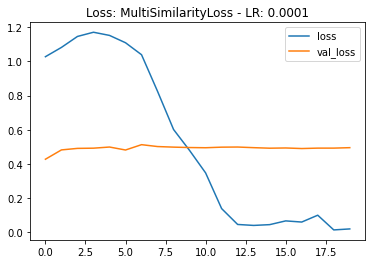

In [7]:
# expect loss: 0.1853 / val_loss: 1.4360
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.title(f'Loss: {loss.name} - LR: {LR}')
plt.show()

In [1]:
x_index, y_index = select_examples(x_train, y_train, CLASSES, 3)
model.reset_index()
model.index(x_index, y_index, data=x_index)

NameError: name 'select_examples' is not defined

selecting classes: 100%|██████████| 27/27 [00:00<00:00, 150994.94it/s]



Performing NN search



Building NN list: 100%|██████████| 27/27 [00:00<00:00, 23111.47it/s]


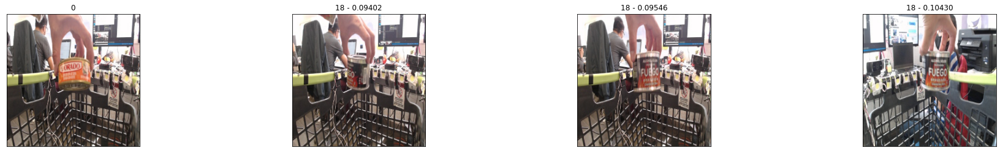

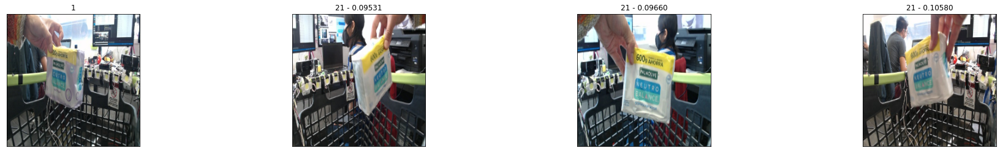

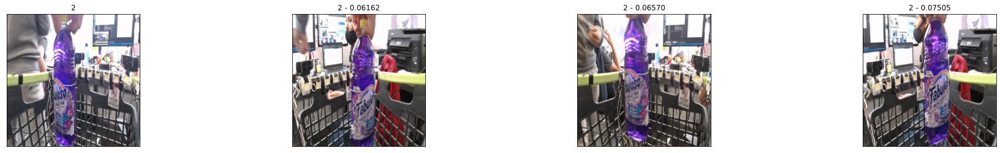

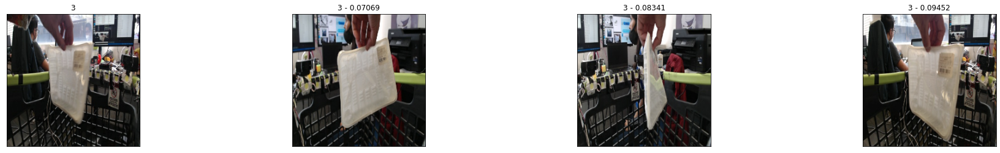

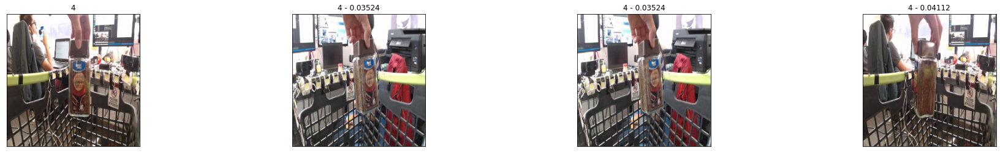

...

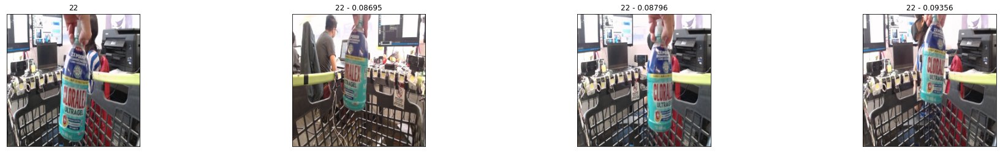

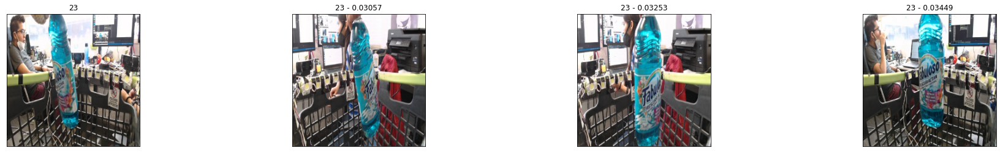

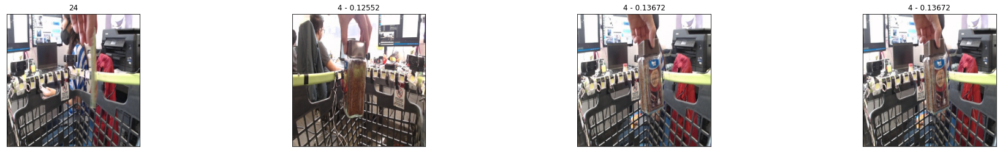

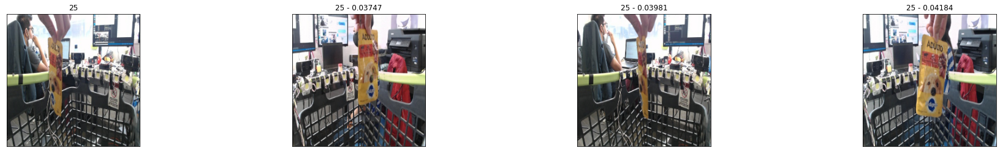

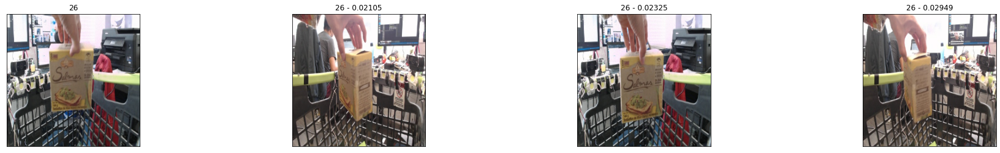

In [16]:
# used to label in images in the viz_neighbors_imgs plots
# note we added a 11th classes for unknown
labels = ["0", "1",  "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20", "21", 
"22", "23", "24", "25", "26", "Unknown"]

# re-run to test on other examples
num_neighboors = 3

# select
x_display, y_display = select_examples(x_test, y_test, CLASSES, 1)

# lookup nearest neighbors in the index
nns = model.lookup(x_display, k=num_neighboors)

# display
for idx in np.argsort(y_display):
    viz_neigbors_imgs(x_display[idx], y_display[idx], nns[idx], 
                      class_mapping=labels, fig_size=(32, 4), cmap='Greys')

# Guardando el modelo

In [10]:
model.save('tf_similarity_model')

2021-09-24 09:36:03.230132: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: tf_similarity_model/assets


INFO:tensorflow:Assets written to: tf_similarity_model/assets
